Start by creating a new `conda` environment:

```bash
$ conda create -n pyannote python=3.5 anaconda
$ source activate pyannote
```

Then, install `pyannote-video` and its dependencies:

```bash
$ conda install cmake
$ conda install gcc
$ conda install -c menpo ffmpeg=3.1.3
$ conda install opencv
$ conda install boost
$ pip install pyannote-video
```

Finally, download sample video and `dlib` models:

```bash
$ git clone https://github.com/pyannote/pyannote-data.git
$ git clone https://github.com/davisking/dlib-models.git
$ bunzip2 dlib-models/dlib_face_recognition_resnet_model_v1.dat.bz2
$ bunzip2 dlib-models/shape_predictor_68_face_landmarks.dat.bz2
```

To execute this notebook locally:
```bash
$ git clone https://github.com/pyannote/pyannote-video.git
$ jupyter notebook --notebook-dir="pyannote-video/doc"
```


In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


# Shot segmentation

In [1]:
mkdir -p ~/data/yt8m/video; cd ~/data/yt8m/video !pyannote-structure.py --help

Video structure

The standard pipeline for is the following:

    shot boundary detection ==> shot threading ==> segmentation into scenes

Usage:
  pyannote-structure.py shot [options] <video> <output.json>
  pyannote-structure.py thread [options] <video> <shot.json> <output.json>
  pyannote-structure.py scene [options] <video> <thread.json> <output.json>
  pyannote-structure.py (-h | --help)
  pyannote-structure.py --version

Options:
  --height=<n_pixels>    Resize video frame to height <n_pixels> [default: 50].
  --window=<n_seconds>   Apply median filtering on <n_seconds> window [default: 2.0].
  --threshold=<value>    Set threshold to <value> [default: 1.0].
  --min-match=<n_match>  Set minimum number of matches to <n_match> [default: 20].
  --lookahead=<n_shots>  Look at up to <n_shots> following shots [default: 24].
  -h --help              Show this screen.
  --version              Show version.
  --verbose              Show progress.


In [1]:
!pyannote-structure.py shot --verbose /home/buddha/thesis/pyannote-data/willi.mp4 /home/buddha/thesis/pyannote-data/willi.shots.json

5.55kframes [03:49, 24.1frames/s]                                               


Detected shot boundaries can be visualized using `pyannote.core` notebook support:

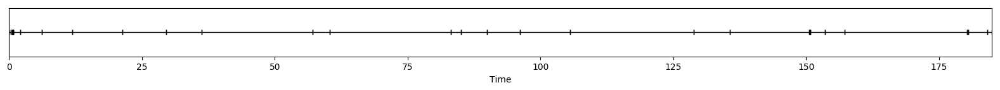

In [2]:
from pyannote.core.json import load_from
shots = load_from('/home/buddha/thesis/pyannote-data/willi.shots.json')
shots

# Face processing

In [4]:
!pyannote-face.py --help

Face detection and tracking

The standard pipeline is the following

      face tracking => facial landmarks detection => feature extraction

Usage:
  pyannote-face track [options] <video> <shot.json> <output>
  pyannote-face landmarks [options] <video> <model> <tracking> <output>
  pyannote-face features [options] <video> <model> <landmark> <output>
  pyannote-face demo [options] <video> <tracking> <output>
  pyannote-face (-h | --help)
  pyannote-face --version

General options:

  -h --help                 Show this screen.
  --version                 Show version.
  --verbose                 Show processing progress.

Face tracking options (track):

  <video>                   Path to video file.
  <shot.json>               Path to shot segmentation result file.
  <output>                  Path to tracking result file.

  --min-size=<ratio>        Approximate size (in video height ratio) of the
                            smallest face that should be detected. Default is
          

### Face tracking

In [4]:
!pyannote-face.py track --verbose --every=0.5 /home/buddha/thesis/pyannote-data/willi.mp4 \
                                              /home/buddha/thesis/pyannote-data/willi.shots.json \
                                              /home/buddha/thesis/pyannote-data/willi.track.txt

5.55kframes [06:16, 14.7frames/s]                                               


Face tracks can be visualized using `demo` mode:

In [5]:
!pyannote-face.py demo /home/buddha/thesis/pyannote-data/willi.mp4 \
                       /home/buddha/thesis/pyannote-data/willi.track.txt \
                       /home/buddha/thesis/pyannote-data/willi.track.mp4

[MoviePy] >>>> Building video /home/buddha/thesis/pyannote-data/willi.track.mp4
[MoviePy] Writing audio in willi.trackTEMP_MPY_wvf_snd.mp3
100%|█████████████████████████████████████| 4079/4079 [00:03<00:00, 1159.84it/s]
[MoviePy] Done.
[MoviePy] Writing video /home/buddha/thesis/pyannote-data/willi.track.mp4
100%|███████████████████████████████████████| 5549/5549 [01:08<00:00, 80.63it/s]
[MoviePy] Done.
[MoviePy] >>>> Video ready: /home/buddha/thesis/pyannote-data/willi.track.mp4 



In [6]:
import io
import base64
from IPython.display import HTML
video = io.open('/home/buddha/thesis/pyannote-data/willi.track.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls><source src="data:video/mp4;base64,{0}" type="video/mp4" /></video>'''.format(encoded.decode('ascii')))

### Facial landmarks and face embedding

In [7]:
!pyannote-face.py extract --verbose /home/buddha/thesis/pyannote-data/willi.mp4 \
                                    /home/buddha/thesis/pyannote-data/willi.track.txt \
                                    /home/buddha/thesis/dlib-models/shape_predictor_68_face_landmarks.dat \
                                    /home/buddha/thesis/dlib-models/dlib_face_recognition_resnet_model_v1.dat \
                                    /home/buddha/thesis/pyannote-data/willi.landmarks.txt \
                                    /home/buddha/thesis/pyannote-data/willi.embedding.txt

5.55kframes [05:32, 16.7frames/s]                                               


### Face clustering

Once embeddings are extracted, let's apply face track hierarchical agglomerative clustering.  
The distance between two clusters is defined as the average euclidean distance between all embeddings.  

In [8]:
from pyannote.video.face.clustering import FaceClustering
clustering = FaceClustering(threshold=0.6)

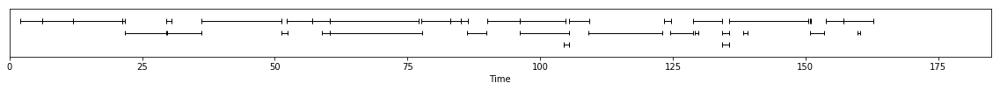

In [11]:
face_tracks, embeddings = clustering.model.preprocess('/home/buddha/thesis/pyannote-data/willi.embedding.txt')
# print(vars(face_tracks))#.get_timeline()
face_tracks.get_timeline()


In [12]:
result = clustering(face_tracks, features=embeddings)
print(result)
distincts = []
for eachLabel in result.labels():
        x = list(embeddings.loc[embeddings['track'] == eachLabel].iloc[0,2:])
        distincts.append(x)
sample_list = [[",".join([str(item) for item in sub])] for sub in distincts]


[ 00:00:02.067 -->  00:00:06.133] 0 9
[ 00:00:06.167 -->  00:00:11.900] 1 9
[ 00:00:11.933 -->  00:00:21.300] 2 9
[ 00:00:21.333 -->  00:00:21.733] 3 9
[ 00:00:21.700 -->  00:00:29.467] 4 9
[ 00:00:29.500 -->  00:00:30.467] 5 9
[ 00:00:29.767 -->  00:00:36.167] 6 9
[ 00:00:36.200 -->  00:00:51.300] 7 9
[ 00:00:51.267 -->  00:00:52.367] 8 9
[ 00:00:52.300 -->  00:00:57.067] 9 9
[ 00:00:57.100 -->  00:01:00.300] 10 9
[ 00:00:58.800 -->  00:01:00.300] 11 9
[ 00:01:00.333 -->  00:01:17.067] 12 9
[ 00:01:00.333 -->  00:01:17.800] 13 9
[ 00:01:17.633 -->  00:01:23.033] 14 9
[ 00:01:23.067 -->  00:01:25.000] 15 9
[ 00:01:25.100 -->  00:01:26.467] 16 9
[ 00:01:26.300 -->  00:01:29.933] 17 9
[ 00:01:29.967 -->  00:01:36.100] 18 9
[ 00:01:36.133 -->  00:01:44.867] 19 9
[ 00:01:36.133 -->  00:01:45.500] 20 9
[ 00:01:44.533 -->  00:01:45.500] 21 9
[ 00:01:45.533 -->  00:01:49.333] 22 9
[ 00:01:49.133 -->  00:02:03.100] 23 9
[ 00:02:03.267 -->  00:02:04.600] 24 9
[ 00:02:04.567 -->  00:02:08.800] 2

In [13]:
print(result.labels())

# iloc[row slicing, column slicing]
# we need to iterate it through for all the labels
x = list(embeddings.loc[embeddings['track'] == result.labels()[0]].iloc[0,2:])


[9]


In [11]:
import csv
with open('2.csv', 'a') as f_csv:
    writer = csv.writer(f_csv, delimiter=',', dialect='excel',quoting =csv.QUOTE_NONE, quotechar='',escapechar=' ')
    writer.writerows(sample_list)
     
print("Writing complete")



Writing complete


In [20]:
import numpy as np

d = 64                           # dimension
nb = 100000                      # database size
nq = 10000                       # nb of queries
np.random.seed(1234)             # make reproducible
xb = np.random.random((nb, d)).astype('float32')
xb[:, 0] += np.arange(nb) / 1000.
xq = np.random.random((nq, d)).astype('float32')
xq[:, 0] += np.arange(nq) / 1000.

xb

array([[1.91519454e-01, 6.22108757e-01, 4.37727749e-01, ...,
        6.24916732e-01, 4.78093803e-01, 1.95675179e-01],
       [3.83317441e-01, 5.38736843e-02, 4.51648414e-01, ...,
        1.51395261e-01, 3.35174650e-01, 6.57551765e-01],
       [7.53425434e-02, 5.50063960e-02, 3.23194802e-01, ...,
        3.44416976e-01, 6.40880406e-01, 1.26205325e-01],
       ...,
       [1.00811470e+02, 5.90245306e-01, 7.98893511e-01, ...,
        3.39859009e-01, 3.01949501e-01, 8.53854537e-01],
       [1.00669464e+02, 9.16068792e-01, 9.55078781e-01, ...,
        5.95364332e-01, 3.84918079e-02, 1.05637990e-01],
       [1.00855637e+02, 5.91134131e-01, 6.78907931e-01, ...,
        2.18976989e-01, 6.53015897e-02, 2.17538327e-01]], dtype=float32)

In [1]:
from numpy import genfromtxt
t = genfromtxt('pplList.csv', delimiter=',')


In [14]:
result.chart()

[(9, 159.49899999999994)]

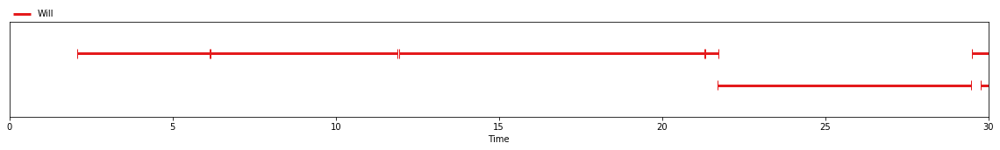

In [15]:
from pyannote.core import notebook, Segment
notebook.reset()
notebook.crop = Segment(0, 30)
mapping = {9: 'Will', 6: 'Sheldon', 15: 'Receptionist', 5: 'Error'}
result = result.rename_labels(mapping=mapping)
result

In [16]:
for _, track_id, cluster in result.itertracks(yield_label=True):
    print(_,track_id, cluster)

[ 00:00:02.067 -->  00:00:06.133] 0 Will
[ 00:00:06.167 -->  00:00:11.900] 1 Will
[ 00:00:11.933 -->  00:00:21.300] 2 Will
[ 00:00:21.333 -->  00:00:21.733] 3 Will
[ 00:00:21.700 -->  00:00:29.467] 4 Will
[ 00:00:29.500 -->  00:00:30.467] 5 Will
[ 00:00:29.767 -->  00:00:36.167] 6 Will
[ 00:00:36.200 -->  00:00:51.300] 7 Will
[ 00:00:51.267 -->  00:00:52.367] 8 Will
[ 00:00:52.300 -->  00:00:57.067] 9 Will
[ 00:00:57.100 -->  00:01:00.300] 10 Will
[ 00:00:58.800 -->  00:01:00.300] 11 Will
[ 00:01:00.333 -->  00:01:17.067] 12 Will
[ 00:01:00.333 -->  00:01:17.800] 13 Will
[ 00:01:17.633 -->  00:01:23.033] 14 Will
[ 00:01:23.067 -->  00:01:25.000] 15 Will
[ 00:01:25.100 -->  00:01:26.467] 16 Will
[ 00:01:26.300 -->  00:01:29.933] 17 Will
[ 00:01:29.967 -->  00:01:36.100] 18 Will
[ 00:01:36.133 -->  00:01:44.867] 19 Will
[ 00:01:36.133 -->  00:01:45.500] 20 Will
[ 00:01:44.533 -->  00:01:45.500] 21 Will
[ 00:01:45.533 -->  00:01:49.333] 22 Will
[ 00:01:49.133 -->  00:02:03.100] 23 Will
[ 

# Query images:

<tr>
    <td> <img src="images/leonard.jpg" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="images/sheldon.jpg"  alt="Drawing" style="width: 250px;"/> </td>
</tr>